<a href="https://colab.research.google.com/github/PhoenixAlpha23/FeedVision/blob/main/Notebooks/Soccer_assignment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# let's try to load the given model and see it's working first.


In [ ]:
!pip install mediapipe
!pip install ultralytics

In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.154 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.1/112.6 GB disk)


In [ ]:
from ultralytics import YOLO

model = YOLO("/content/best.pt")  # Fine-tuned model provided in the assignmnet document.

# Display model information
print(model.info())

YOLOv5x summary: 285 layers, 97,203,260 parameters, 0 gradients, 246.9 GFLOPs
(285, 97203260, 0, 246.91051520000002)


In [ ]:
#tacticamfeed = model.predict(source="/content/tacticam.mp4", save=True)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/201) /content/tacticam.mp4: 384x640 22 players, 2 referees, 76.1ms
video 1/1 (frame 2/201) /content/tacticam.mp4: 384x640 22 players, 1 referee, 43.6ms
video 1/1 (frame 3/201) /content/tacticam.mp4: 384x640 22 players, 1 referee, 43.6ms
video 1/1 (frame 4/201) /content/tacticam.mp4: 384x640 22 players, 43.5ms
video 1/1 (frame 5/201) /content/tacticam.mp4: 384x640 1 ball, 22 players, 1 referee, 40.7ms
video 1/1 (frame 6/201) /content/

In [ ]:
import cv2
from google.colab.patches import cv2_imshow
import numpy as np
import mediapipe as mp
from scipy.spatial.distance import cosine
import matplotlib.pyplot as plt

## Mediapipe pose setup

In [ ]:
class PoseExtractor:
    def __init__(self):
        self.mp_pose = mp.solutions.pose
        self.pose = self.mp_pose.Pose(
            static_image_mode=False,
            model_complexity=1,
            enable_segmentation=False,
            min_detection_confidence=0.5
        )

    def extract_pose_proportions(self, cropped_player_image):
        """Extract body proportions from cropped player image"""
        # Convert BGR to RGB for MediaPipe
        rgb_image = cv2.cvtColor(cropped_player_image, cv2.COLOR_BGR2RGB)
        results = self.pose.process(rgb_image)

        if not results.pose_landmarks:
            return None

        landmarks = results.pose_landmarks.landmark

        # Calculate key body proportions
        proportions = {}

        try:
            # Get key landmarks
            left_shoulder = landmarks[self.mp_pose.PoseLandmark.LEFT_SHOULDER]
            right_shoulder = landmarks[self.mp_pose.PoseLandmark.RIGHT_SHOULDER]
            left_hip = landmarks[self.mp_pose.PoseLandmark.LEFT_HIP]
            right_hip = landmarks[self.mp_pose.PoseLandmark.RIGHT_HIP]
            nose = landmarks[self.mp_pose.PoseLandmark.NOSE]

            # Shoulder width
            shoulder_width = np.sqrt((left_shoulder.x - right_shoulder.x)**2 +
                                   (left_shoulder.y - right_shoulder.y)**2)

            # Torso height (shoulder center to hip center)
            shoulder_center_y = (left_shoulder.y + right_shoulder.y) / 2
            hip_center_y = (left_hip.y + right_hip.y) / 2
            torso_height = abs(shoulder_center_y - hip_center_y)

            # Head to shoulder distance
            head_shoulder_dist = abs(nose.y - shoulder_center_y)

            # Calculate ratios (view-invariant features)
            if torso_height > 0:
                proportions['shoulder_torso_ratio'] = shoulder_width / torso_height
                proportions['head_torso_ratio'] = head_shoulder_dist / torso_height

            # Hip width to shoulder width ratio
            hip_width = np.sqrt((left_hip.x - right_hip.x)**2 +
                               (left_hip.y - right_hip.y)**2)
            if shoulder_width > 0:
                proportions['hip_shoulder_ratio'] = hip_width / shoulder_width

        except:
            return None

        return proportions

In [ ]:
class ColorExtractor:
    def __init__(self):
        pass

    def extract_dominant_jersey_color(self, cropped_player):
        """Extract dominant color from player's jersey area (upper body)"""
        h, w = cropped_player.shape[:2]

        # Focus on upper torso area (jersey region)
        jersey_region = cropped_player[int(h*0.2):int(h*0.7), int(w*0.1):int(w*0.9)]

        # Convert to HSV for better color analysis
        hsv = cv2.cvtColor(jersey_region, cv2.COLOR_BGR2HSV)

        # Get dominant color using K-means
        pixels = hsv.reshape(-1, 3)
        pixels = np.float32(pixels)

        # K-means clustering to find dominant colors
        criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 20, 1.0)
        k = 3  # Find top 3 colors
        _, labels, centers = cv2.kmeans(pixels, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

        # Find the most frequent cluster (dominant color)
        unique, counts = np.unique(labels, return_counts=True)
        dominant_color_idx = unique[np.argmax(counts)]
        dominant_hsv = centers[dominant_color_idx]

        return dominant_hsv

    def classify_team(self, dominant_hsv):
        """Simple team classification based on jersey color"""
        h, s, v = dominant_hsv

        if (h < 10 or h > 170) and s > 100:  # Red-ish
            return "team_red"
        elif s < 50 and v > 150:  # White-ish
            return "team_white"
        elif h > 100 and h < 130:  # Blue-ish
            return "team_blue"
        else:
            return "team_other"

In [ ]:
class PlayerMatcher:
    def __init__(self):
        self.weights = {
            'pose': 0.5,
            'jersey': 0.3,
            'spatial': 0.2
        }

    def compute_pose_similarity(self, props1, props2):
        """Compute similarity between two pose proportion dictionaries"""
        if props1 is None or props2 is None:
            return 1.0  # Maximum dissimilarity

        # Common keys in both dictionaries
        common_keys = set(props1.keys()) & set(props2.keys())
        if not common_keys:
            return 1.0

        # Compute average difference across all proportion ratios
        differences = []
        for key in common_keys:
            diff = abs(props1[key] - props2[key])
            differences.append(diff)

        return np.mean(differences) if differences else 1.0

    def match_players(self, feed1_features, feed2_features):
        """Match players between two feeds"""
        matches = []

        for i, f1 in enumerate(feed1_features):
            best_match_idx = -1
            best_score = float('inf')

            for j, f2 in enumerate(feed2_features):
                # Skip if different teams
                if f1['team'] != f2['team']:
                    continue

                # Compute similarity score
                pose_sim = self.compute_pose_similarity(f1['pose_props'], f2['pose_props'])

                # Simple spatial proximity (if players are in roughly same field area)
                spatial_sim = np.sqrt((f1['center'][0] - f2['center'][0])**2 +
                                    (f1['center'][1] - f2['center'][1])**2) / 1000  # Normalize

                # Combined score
                total_score = (pose_sim * self.weights['pose'] +
                             spatial_sim * self.weights['spatial'])

                if total_score < best_score:
                    best_score = total_score
                    best_match_idx = j

            if best_match_idx != -1 and best_score < 0.5:  # Threshold
                matches.append((i, best_match_idx, best_score))

        return matches

In [ ]:
def test_on_your_predictions(tacticam_results, broadcast_results, tacticam_frame, broadcast_frame):
    """
    Test the implementation on your YOLO predictions

    Args:
        tacticam_results: YOLO results from tacticam.mp4
        broadcast_results: YOLO results from broadcast.mp4
        tacticam_frame: Current frame from tacticam video
        broadcast_frame: Current frame from broadcast video
    """

    # Initialize extractors
    pose_extractor = PoseExtractor()
    color_extractor = ColorExtractor()
    matcher = PlayerMatcher()

    def process_detections(results, frame, feed_name):
        """Process YOLO detections to extract features"""
        features = []

        for detection in results:
            # Extract bounding box (adjust based on your YOLO output format)
            # Assuming detection has .boxes.xyxy format - adjust as needed
            if hasattr(detection, 'boxes') and len(detection.boxes) > 0:
                for box in detection.boxes:
                    x1, y1, x2, y2 = map(int, box.xyxy[0])  # Adjust based on your format

                    # Filter for players only (adjust class filtering as needed)
                    # if box.cls[0] == player_class_id:  # Uncomment and set your player class ID

                    # Crop player region
                    cropped_player = frame[y1:y2, x1:x2]

                    if cropped_player.size == 0:
                        continue

                    # Extract features
                    pose_props = pose_extractor.extract_pose_proportions(cropped_player)
                    dominant_color = color_extractor.extract_dominant_jersey_color(cropped_player)
                    team = color_extractor.classify_team(dominant_color)

                    # Calculate center point
                    center = ((x1 + x2) // 2, (y1 + y2) // 2)

                    feature_dict = {
                        'bbox': (x1, y1, x2, y2),
                        'center': center,
                        'pose_props': pose_props,
                        'team': team,
                        'dominant_color': dominant_color,
                        'feed': feed_name
                    }

                    features.append(feature_dict)

        return features

    # Process both feeds
    print("Processing tacticam feed...")
    tacticam_features = process_detections(tacticam_results, tacticam_frame, "tacticam")

    print("Processing broadcast feed...")
    broadcast_features = process_detections(broadcast_results, broadcast_frame, "broadcast")

    # Match players across feeds
    print("Matching players across feeds...")
    matches = matcher.match_players(tacticam_features, broadcast_features)

    # Display results
    print(f"\nFound {len(tacticam_features)} players in tacticam")
    print(f"Found {len(broadcast_features)} players in broadcast")
    print(f"Found {len(matches)} cross-feed matches")

    for i, (t_idx, b_idx, score) in enumerate(matches):
        t_feature = tacticam_features[t_idx]
        b_feature = broadcast_features[b_idx]
        print(f"Match {i+1}: Tacticam player at {t_feature['center']} <-> Broadcast player at {b_feature['center']} (score: {score:.3f})")

    return tacticam_features, broadcast_features, matches

In [ ]:
def process_video_with_matching(model, video1_path, video2_path, frame_skip=10):
    """
    Process both videos frame by frame and find player matches

    Args:
        model: Your loaded YOLO model
        video1_path: Path to first video (e.g., 'tacticam.mp4')
        video2_path: Path to second video (e.g., 'broadcast.mp4')
        frame_skip: Process every N frames (to save computation)
    """

    # Initialize extractors
    pose_extractor = PoseExtractor()
    color_extractor = ColorExtractor()
    matcher = PlayerMatcher()

    # Open videos
    cap1 = cv2.VideoCapture(video1_path)
    cap2 = cv2.VideoCapture(video2_path)

    # Get video properties
    fps1 = int(cap1.get(cv2.CAP_PROP_FPS))
    fps2 = int(cap2.get(cv2.CAP_PROP_FPS))
    total_frames1 = int(cap1.get(cv2.CAP_PROP_FRAME_COUNT))
    total_frames2 = int(cap2.get(cv2.CAP_PROP_FRAME_COUNT))

    print(f"Video 1: {total_frames1} frames at {fps1} FPS")
    print(f"Video 2: {total_frames2} frames at {fps2} FPS")

    frame_num = 0
    matches_history = []

    while True:
        # Read frames
        ret1, frame1 = cap1.read()
        ret2, frame2 = cap2.read()

        if not ret1 or not ret2:
            break

        # Skip frames for efficiency
        if frame_num % frame_skip != 0:
            frame_num += 1
            continue

        print(f"\nProcessing frame {frame_num}...")

        # Run YOLO on both frames using stream=True for memory efficiency
        results1 = list(model.predict(frame1, stream=True, verbose=False))
        results2 = list(model.predict(frame2, stream=True, verbose=False))

        # Extract features from detections
        features1 = extract_features_from_results(results1[0], frame1, pose_extractor, color_extractor, "video1")
        features2 = extract_features_from_results(results2[0], frame2, pose_extractor, color_extractor, "video2")

        # Match players across videos
        if features1 and features2:
            matches = matcher.match_players(features1, features2)
            matches_history.append({
                'frame': frame_num,
                'matches': matches,
                'features1': features1,
                'features2': features2
            })

            print(f"Frame {frame_num}: Found {len(features1)} players in video1, {len(features2)} in video2")
            print(f"Cross-video matches: {len(matches)}")

            # Visualize this frame (optional)
            if len(matches) > 0:
                visualize_frame_matches(frame1, frame2, features1, features2, matches, frame_num)

        frame_num += 1

        # Process only first few frames for testing
        if frame_num > 150:  # Stop after processing ~5 frames
            break

    cap1.release()
    cap2.release()

    return matches_history

def extract_features_from_results(results, frame, pose_extractor, color_extractor, feed_name):
    """Extract features from YOLO results object"""
    features = []

    # Check if there are any detections
    if results.boxes is None or len(results.boxes) == 0:
        return features

    # Process each detection
    for i in range(len(results.boxes)):
        # Get bounding box coordinates
        box = results.boxes[i]
        x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())
        confidence = float(box.conf[0].cpu().numpy())
        class_id = int(box.cls[0].cpu().numpy())


        # You may need to check what class IDs your model uses
        class_names = results.names  # Dictionary mapping class_id to class_name
        class_name = class_names[class_id]

        if class_name not in ['player', 'goalkeeper']:  # Adjust based on your class names
            continue

        # Skip low confidence detections
        if confidence < 0.5:
            continue

        # Crop player region
        cropped_player = frame[y1:y2, x1:x2]

        if cropped_player.size == 0:
            continue

        try:
            # Extract pose features
            pose_props = pose_extractor.extract_pose_proportions(cropped_player)

            # Extract color features
            dominant_color = color_extractor.extract_dominant_jersey_color(cropped_player)
            team = color_extractor.classify_team(dominant_color)

            # Calculate center point
            center = ((x1 + x2) // 2, (y1 + y2) // 2)

            feature_dict = {
                'bbox': (x1, y1, x2, y2),
                'center': center,
                'confidence': confidence,
                'class_name': class_name,
                'pose_props': pose_props,
                'team': team,
                'dominant_color': dominant_color,
                'feed': feed_name
            }

            features.append(feature_dict)

        except Exception as e:
            print(f"Error processing detection: {e}")
            continue

    return features

def visualize_frame_matches(frame1, frame2, features1, features2, matches, frame_num):
    """Visualize matches for a specific frame"""

    # Resize frames if they're too large
    h1, w1 = frame1.shape[:2]
    h2, w2 = frame2.shape[:2]

    if h1 > 500:
        scale = 500 / h1
        frame1 = cv2.resize(frame1, (int(w1 * scale), int(h1 * scale)))
        frame2 = cv2.resize(frame2, (int(w2 * scale), int(h2 * scale)))

        # Scale feature coordinates too
        for f in features1:
            x1, y1, x2, y2 = f['bbox']
            f['bbox'] = (int(x1*scale), int(y1*scale), int(x2*scale), int(y2*scale))
        for f in features2:
            x1, y1, x2, y2 = f['bbox']
            f['bbox'] = (int(x1*scale), int(y1*scale), int(x2*scale), int(y2*scale))

    # Draw detections on frame1
    vis1 = frame1.copy()
    for i, feature in enumerate(features1):
        x1, y1, x2, y2 = feature['bbox']
        cv2.rectangle(vis1, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(vis1, f"{i}:{feature['team']}", (x1, y1-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Draw detections on frame2
    vis2 = frame2.copy()
    for i, feature in enumerate(features2):
        x1, y1, x2, y2 = feature['bbox']
        cv2.rectangle(vis2, (x1, y1), (x2, y2), (0, 0, 255), 2)
        cv2.putText(vis2, f"{i}:{feature['team']}", (x1, y1-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

    # Highlight matches
    for match_id, (idx1, idx2, score) in enumerate(matches):
        # Draw match IDs
        x1, y1, x2, y2 = features1[idx1]['bbox']
        cv2.putText(vis1, f"M{match_id}", (x1, y2+20),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 255), 2)

        x1, y1, x2, y2 = features2[idx2]['bbox']
        cv2.putText(vis2, f"M{match_id}", (x1, y2+20),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 255), 2)

    # Combine frames side by side
    combined = np.hstack([vis1, vis2])

    # Add frame info
    cv2.putText(combined, f"Frame {frame_num} - {len(matches)} matches",
                (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    print(f'Showing Frame {frame_num} with {len(matches)} matches')
    cv2_imshow(combined)

In [ ]:
def quick_test(model):
    """Quick test on your videos"""
    print("Starting quick test...")

    # Process both videos
    matches_history = process_video_with_matching(
        model,
        '/content/tacticam.mp4',
        '/content/broadcast.mp4',
        frame_skip=10  # Process every 10th frame
    )

    # Print summary
    print(f"\nProcessed {len(matches_history)} frames")
    total_matches = sum(len(h['matches']) for h in matches_history)
    print(f"Total matches found: {total_matches}")

    return matches_history

Starting quick test...
Video 1: 201 frames at 24 FPS
Video 2: 132 frames at 24 FPS

Processing frame 0...
Frame 0: Found 21 players in video1, 3 in video2
Cross-video matches: 0

Processing frame 10...
Frame 10: Found 21 players in video1, 12 in video2
Cross-video matches: 5
Showing Frame 10 with 5 matches


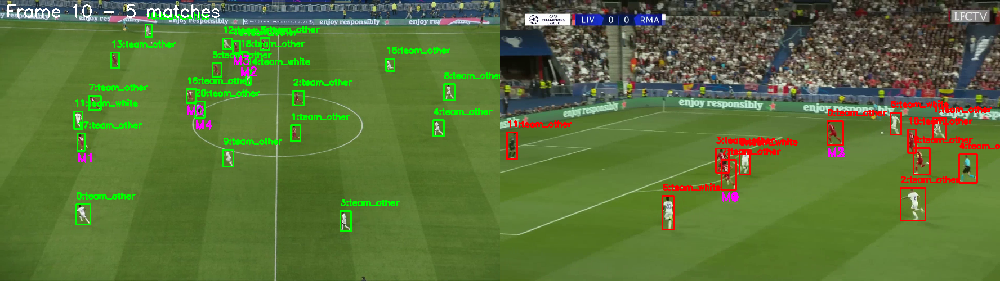


Processing frame 20...
Frame 20: Found 21 players in video1, 11 in video2
Cross-video matches: 6
Showing Frame 20 with 6 matches


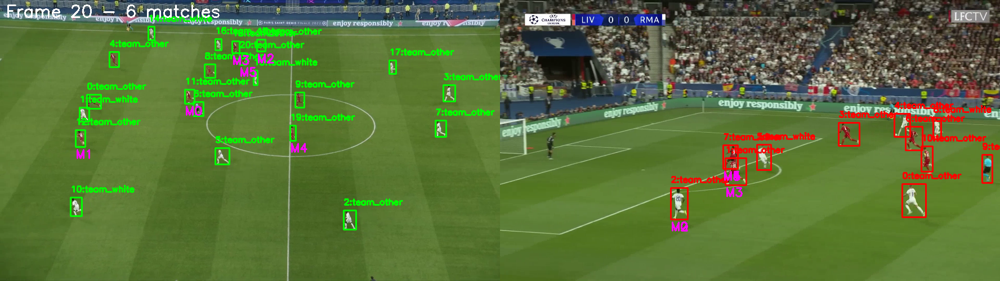


Processing frame 30...
Frame 30: Found 20 players in video1, 12 in video2
Cross-video matches: 10
Showing Frame 30 with 10 matches


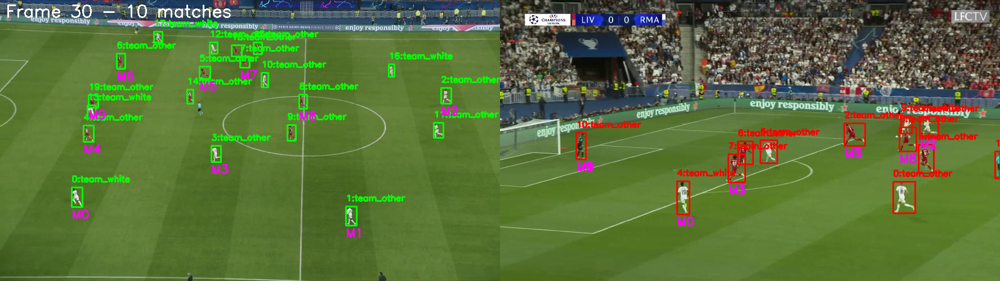


Processing frame 40...
Frame 40: Found 21 players in video1, 11 in video2
Cross-video matches: 0

Processing frame 50...
Frame 50: Found 21 players in video1, 12 in video2
Cross-video matches: 15
Showing Frame 50 with 15 matches


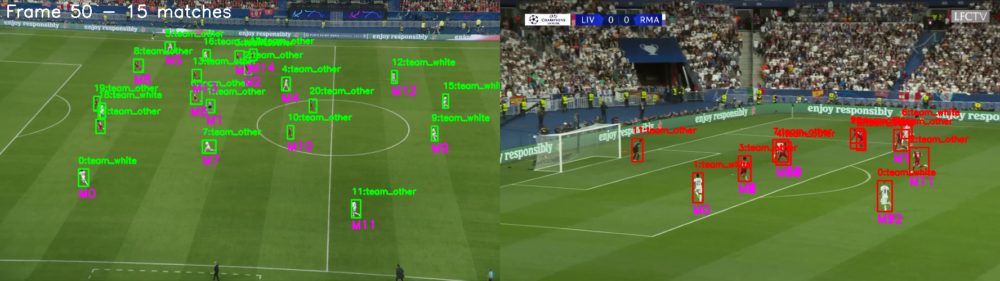


Processing frame 60...
Frame 60: Found 21 players in video1, 11 in video2
Cross-video matches: 7
Showing Frame 60 with 7 matches


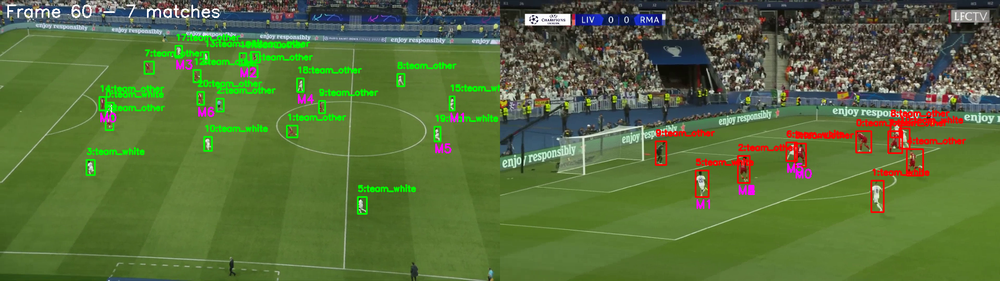


Processing frame 70...
Frame 70: Found 20 players in video1, 12 in video2
Cross-video matches: 0

Processing frame 80...
Frame 80: Found 21 players in video1, 11 in video2
Cross-video matches: 6
Showing Frame 80 with 6 matches


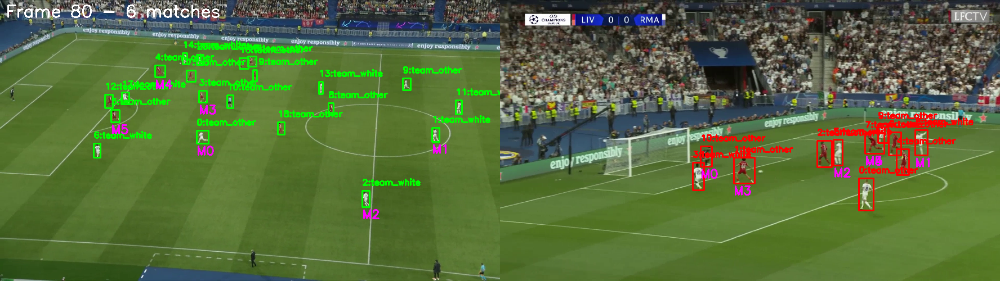


Processing frame 90...
Frame 90: Found 21 players in video1, 13 in video2
Cross-video matches: 7
Showing Frame 90 with 7 matches


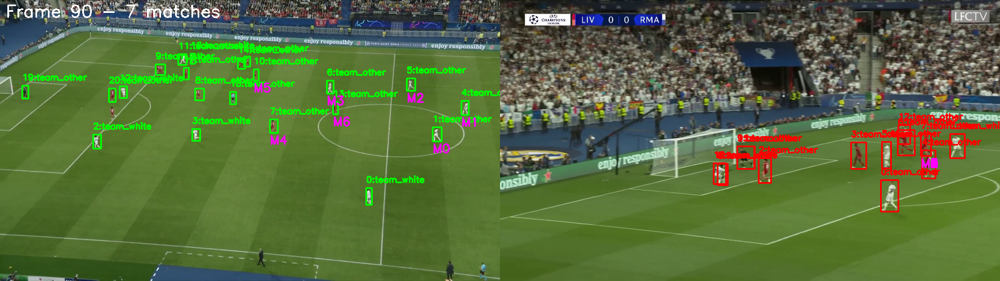


Processing frame 100...
Frame 100: Found 20 players in video1, 10 in video2
Cross-video matches: 0

Processing frame 110...
Frame 110: Found 18 players in video1, 9 in video2
Cross-video matches: 13
Showing Frame 110 with 13 matches


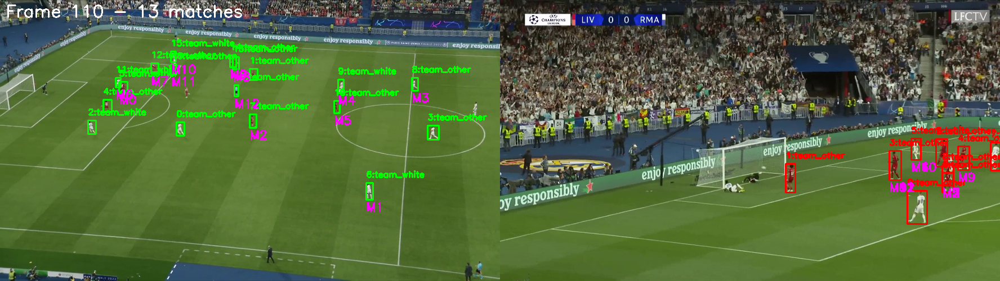


Processing frame 120...
Frame 120: Found 19 players in video1, 10 in video2
Cross-video matches: 7
Showing Frame 120 with 7 matches


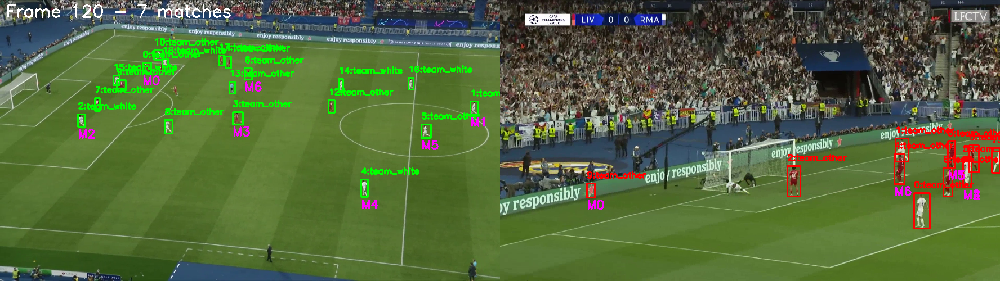


Processing frame 130...

Processed 13 frames
Total matches found: 76


[{'frame': 0,
  'matches': [],
  'features1': [{'bbox': (314, 526, 366, 590),
    'center': (340, 558),
    'confidence': 0.925732433795929,
    'class_name': 'player',
    'pose_props': None,
    'team': 'team_other',
    'dominant_color': array([     34.444,      139.97,      125.19], dtype=float32),
    'feed': 'video1'},
   {'bbox': (1716, 320, 1748, 383),
    'center': (1732, 351),
    'confidence': 0.9226102828979492,
    'class_name': 'player',
    'pose_props': None,
    'team': 'team_white',
    'dominant_color': array([      44.94,      22.161,      207.27], dtype=float32),
    'feed': 'video1'},
   {'bbox': (1133, 480, 1175, 543),
    'center': (1154, 511),
    'confidence': 0.9221811294555664,
    'class_name': 'player',
    'pose_props': None,
    'team': 'team_other',
    'dominant_color': array([     33.542,      153.87,      112.98], dtype=float32),
    'feed': 'video1'},
   {'bbox': (928, 197, 967, 247),
    'center': (947, 222),
    'confidence': 0.920013427734375,
  

In [ ]:
quick_test(model)